# Processamento de Imagem Digital

## Trabalho 4

### Introdução

O trabalho tem por objetivo implementar técnicas de transformações geométricas e registro de imagens.

As transformações geométricas tem como principal objetivo permitir mapear posições de pixeis iniciais de uma imagem original em pixeis novos de uma imagem modificada segundo uma transformação espacial. Ou seja, uma transformação geométrica é constituída por duas etapas: uma trasnformação espacial, que define o mapeamento para a reorganização dos pixeis na nova imagem, e uma interpolação de intensidade, que permite determinar a intensidade de cada novo pixel.

Entre as transformações espaciais mais básicas estão:

1. Translação
2. Escala
3. Rotação
4. Reflexão
5. Cisalhamento
6. Perspectiva

No contexto deste trabalho, iremos focar em transformações espaciais de escala e uma combinação entre rotação, escala e translação que permita o acesso a imagens rotacionadas sem perda de informação.

O registro de imagens, por sua vez, é o processo de correspondência ou alinhamento entre duas imagens que tenham cenas (objetos, disposição e cenário) em comum, porém que diferem em alguma característica de captura. As principais características de captura de interesse são: o ponto de observação, o instante no tempo e os sensores utilizados.

No contexto deste trabalho, utilizaremos técnicas de detecção de pontos de interessse para definir parâmetros de registro de imagem, de modo a criar imagens panorâmicas formadas pela concatenação de imagens.

### Preparação

#### Requisitos

In [1]:
# Conetando ao google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Importando pacotes que serão utilizados
import cv2
import numpy as np
import numpy.typing as npt
from google.colab.patches import cv2_imshow
from typing import Callable, Tuple

#### Imagens

Para validar os algoritmos desenvolvidos, iremos utilizar imagens de diferentes dimensões.

Serão utilizadas as imagens disponibilizadas pelo professor em seu [repositório de imagens png](https://www.ic.unicamp.br/~helio/imagens_png/)(todas de dimensões 512x512) e uma imagem a mais com diferentes dimensões (watch).

In [ ]:
# Carregando imagem do drive em escala de cinza
images = {
    "baboon": cv2.imread("/content/drive/MyDrive/MC920/T4/baboon.png", cv2.IMREAD_GRAYSCALE),
    "baboon_perspective": cv2.imread("/content/drive/MyDrive/MC920/T4/baboon_perspective.png", cv2.IMREAD_GRAYSCALE),
    "butterfly": cv2.imread("/content/drive/MyDrive/MC920/T4/butterfly.png", cv2.IMREAD_GRAYSCALE),
    "city": cv2.imread("/content/drive/MyDrive/MC920/T4/city.png", cv2.IMREAD_GRAYSCALE),
    "house": cv2.imread("/content/drive/MyDrive/MC920/T4/house.png", cv2.IMREAD_GRAYSCALE),
    "seagull": cv2.imread("/content/drive/MyDrive/MC920/T4/seagull.png", cv2.IMREAD_GRAYSCALE),
    "watch": cv2.imread("/content/drive/MyDrive/MC920/T4/watch.png", cv2.IMREAD_GRAYSCALE),
}

for name, image in images.items():
    print(f"Imagem `{name}` tem dimensões {image.shape} e tons de cinza armazenados em inteiros {image.dtype}")

Imagem `baboon` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `baboon_perspective` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `butterfly` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `city` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `house` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `seagull` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `watch` tem dimensões (768, 1024) e tons de cinza armazenados em inteiros uint8


Para alguns testes, principalmente sobre métodos de interpolação, iremos utilizar como principal teste a imagem do babuíno, devido a larga quantidade de resultados para comparação.

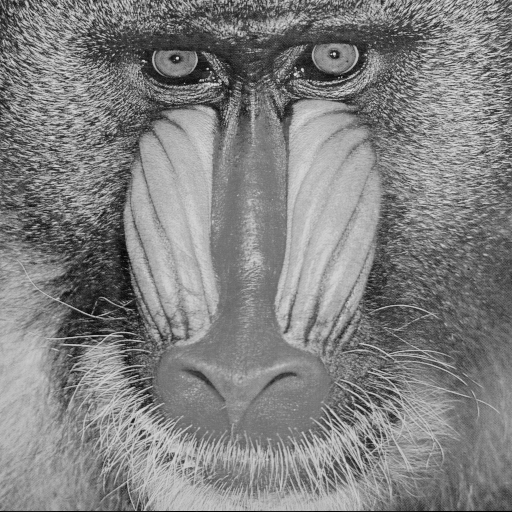

In [ ]:
cv2_imshow(images["baboon"])

Para outros testes, que exigem imagens retângulares para garantir a corretude das transformações espaciais, iremos utilizar a imagem do relógio, sem nenhuma motivação específica além das dimensões.

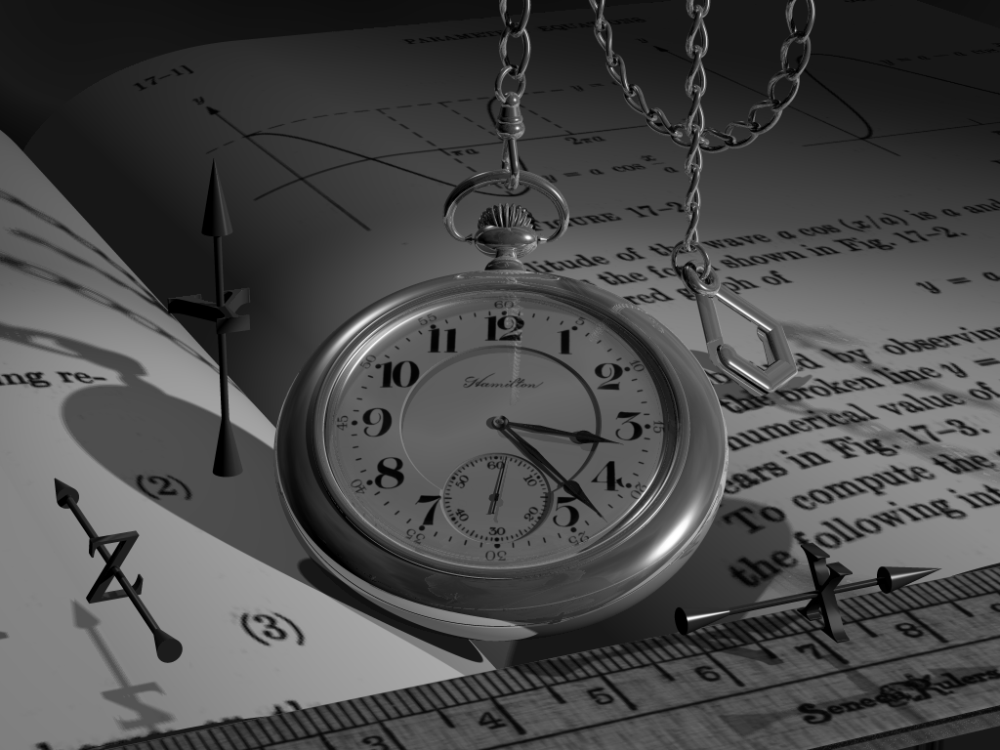

In [ ]:
cv2_imshow(images["watch"])

É importante salientar que utilizaremos todas as imagens em níveis de cinza para manter o escopo de interpolação fechado.

### 1. Transformações Geométricas

Como citado anteriormente, na primeira parte do trabalho, iremos trabalhar com 2 tipos de transformações geométricas: escala e rotação.

Para a escala, teremos suporte para definição de um fator de escala uniforme ou das dimensões esperadas para a imagem final.

Para a rotação, iremos definir apenas o ângulo de rotação medido em graus e no sentido anti-horário.

#### Métodos de Interpolação

Na etapa de interpolação de intensidade dos níveis de cinza, iremos implementar quatro métodos:

1. vizinho mais próximo (nearest_neighbor)
2. bilinear (bilinear)
3. bicúbica (bicubic)
4. polinômios de Lagrange (lagrange)



Nesta etapa, supomos que a responsabilidade por definir uma matriz de mapeamento espacial entre pixeis na nova imagem e a imagem original será das implementações específicas (escala e rotação), a interpolação necessita definir apenas qual o nível de cinza mais adequado para um pixel na nova imagem de coordenadas (x_new, y_new) que é mapeado pela trasnformação espacial inversa para o pixel (x_, y_) na imagem original.

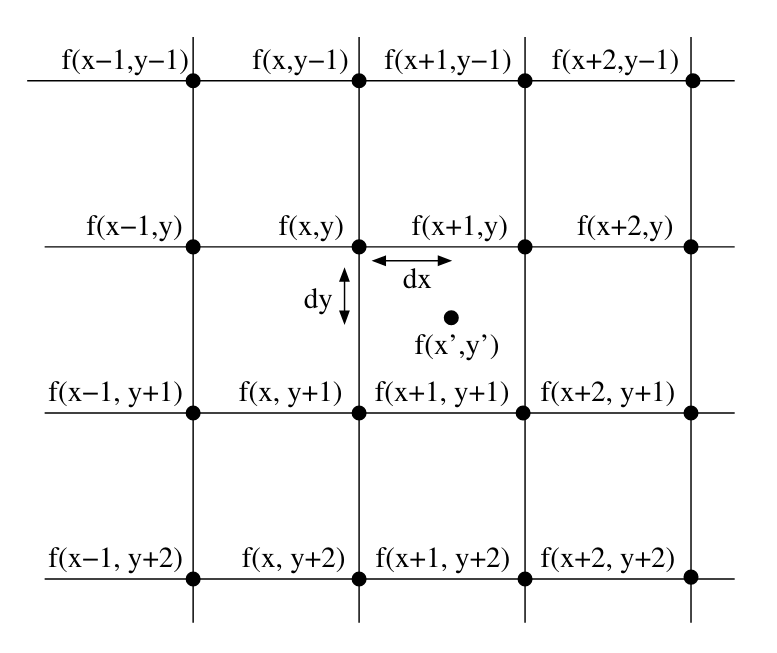

Ou seja, dada a matriz de transformação espacial inversa $T_e^{-1}$ e um ponto ($x_{new}, y_{new}$), teremos:

$
\left(\begin{array}{cc}
x' \\
y' \\
1
\end{array}\right)
=
T_e^{-1}
\left(\begin{array}{cc}
x_{new} \\
y_{new} \\
1
\end{array}\right)
$

Dessa forma, independente do método de interpolação, teremos definidos x', y', dx e dy. Note que x' e y' serão x_ e y_ na implementação, devido a restrições para nomes de variáveis da linguagem python.

É importante notar que utilizamos coordenadas homogêneas de modo a possibilitar a inclusão da operação de transformação espacial de translação no conjunto de operações multiplicativas.

##### Interpolacão pelo Vizinho Mais Próximo

A interpolação pelo vizinho mais próximo é feita tomando o valor de pixel da imagem original mais próximo ao ponto obtido pelo mapeamento inverso.

Ou seja:

$f(x', y')=f(round(x'), round(y'))$

##### Interpolacão Bilinear

A interpolação bilinear é uma média dos 4 vizinhos mais próximos ponderada pelas distâncias do ponto a estes vizinhos.

Ou seja:

$f(x', y') = (1 - dx) * (1 - dy) * f(x, y) + dx * (1 - dy) * f(x + 1, y) + (1 - dx) * dy * f(x, y + 1) + dx * dy *f(x + 1, y + 1) $

Alternativamente, podemos reescrever como:

$ f(x', y') = \sum_{n=0}^{n=1} \sum_{m=0}^{m=1} T(dy, n) * T(dx, m) * f(x+m, y+n) $

$ T(d, i) = d * i + (1 - d) * (1 - i) $

##### Interpolação Bicúbica

A interpolação bicúbica será feita utilizando uma função B-spline cúbica sobre os 16 vizinhos mais próximos do ponto, de forma que:

$ f(x', y') = \sum_{n=-1}^{n=2} \sum_{m=-1}^{m=2}  f(x+m, y+n) * R(m - dx) * R(n - dy) $

$ R(s) = \frac{1}{6}  [P(s + 2)^{3} - 4 * P(s + 1)^{3} + 6 * P(s)^{3} - 4 * P(s - 1)^{3}] $

$ P(t) = t, t > 0 $

$ P(t) = 0, t <= 0 $

##### Interpolação por Polinômios de Lagrange

A interpolação por polinômios de Lagrange será feita utilizando uma função polinomial sobre os 16 vizinhos mais próximos do ponto, de forma que:

$ f(x', y') = \frac{-dy * (dy - 1) * (dy - 2) * L(1)}{6} + \frac{(dy + 1) * (dy - 1) * (dy - 2) * L(2)}{2} + \frac{-dy * (dy + 1) * (dy - 2) * L(3)}{2} + \frac{dy * (dy + 1) * (dy - 1) * L(4)}{6} $

$ L(n) = \frac{-dx * (dx - 1) * (dx - 2) * f(x - 1, y + n - 2)}{6} + \frac{(dx + 1) * (dx - 1) * (dx - 2) * f(x, y + n - 2)}{2} + \frac{-dx * (dx + 1) * (dx - 2) * f(x + 1, y + n - 2)}{2} + \frac{dx * (dx + 1) * (dx - 1) * f(x + 2, y + n - 2)}{6} $

##### Implementação

Para a implementação, utilizaremos as definições acima.

Também iremos, antes de incluir termos que dependem de f(a, b), verificar se (a, b) estão presentes na imagem original.

Em última instância, contruimos a função de interpolação aplicando a vetorização (`np.vectorize`) dos métodos, de modo a poder utilizar a função `np.fromfunction` para construir a nova imagem a partir da original.

In [ ]:
def get_interpolation_function(
    original_image: npt.NDArray,
    map_transform: npt.NDArray,
    method: str = "nearest_neighbor",
) -> Callable:
    max_x = original_image.shape[1] - 1
    max_y = original_image.shape[0] - 1

    def get_original_coordinates_and_distances(new_y: int, new_x: int) -> Tuple[float, float, float, float]:
        new_coordinates = np.array([new_x,new_y,1])
        x_, y_ , _ = np.matmul(map_transform, new_coordinates)
        dx, dy = x_ - int(x_), y_ - int(y_)

        return x_, y_, dx, dy

    def nearest_neighbor(new_y: int, new_x: int) -> int:
        x_, y_, _, _ = get_original_coordinates_and_distances(new_y, new_x)

        y_nearest, x_nearest = (round(y_), round(x_))

        # Check if the neighbor exists within original image
        if 0 <= y_nearest <= max_y and 0 <= x_nearest <= max_x:
            return original_image[(y_nearest, x_nearest)]

        return 0

    def bilinear(new_y: int, new_x: int) -> int:
        x_, y_, dx, dy = get_original_coordinates_and_distances(new_y, new_x)

        coords = {(n,m): (int(y_+n), int(x_+m)) for n in range(0,2) for m in range(0,2)}
        valid_coords = {k: (h, g) for k, (h, g) in coords.items() if 0 <= h <= max_y and 0 <= g <= max_x}

        def T(d, i):
            return d * i + (1 - d) * (1 - i)

        value = 0
        for (n, m), coord in valid_coords.items():
            value += T(dy, n) * T(dx, m) * original_image[coord]

        return value

    def bicubic(new_y: int, new_x: int) -> int:
        x_, y_, dx, dy = get_original_coordinates_and_distances(new_y, new_x)

        def L(n):
            coords = [(int(y_ + n - 2), int(x_ + e)) for e in range(-1,3)]

            p = []
            p.append((-dx * (dx - 1) * (dx - 2)) / 6)
            p.append(((dx + 1) * (dx - 1) * (dx - 2)) / 2)
            p.append((-dx * (dx + 1) * (dx - 2)) / 2)
            p.append((dx * (dx + 1) * (dx - 1)) / 6)

            partial = 0
            for i, (h, g) in enumerate(coords):
                if 0 <= h <= max_y and 0 <= g <= max_x:
                    partial += p[i] * original_image[h, g]
            return partial

        value = (-dy * (dy - 1) * (dy - 2) * L(1)) / 6
        value += ((dy + 1) * (dy - 1) * (dy - 2) * L(2)) / 2
        value += (-dy * (dy + 1) * (dy - 2) * L(3)) / 2
        value += (dy * (dy + 1) * (dy - 1) * L(4)) / 6

        return value

    def lagrange(new_y: int, new_x: int) -> int:
        x_, y_, dx, dy = get_original_coordinates_and_distances(new_y, new_x)

        coords = {(n,m): (int(y_+n), int(x_+m)) for n in range(-1,3) for m in range(-1,3)}
        valid_coords = {k: (h, g) for k, (h, g) in coords.items() if 0 <= h <= max_y and 0 <= g <= max_x}

        def R(s):
            return ((P(s + 2) ** 3) - 4 * (P(s + 1) ** 3) + 6 * (P(s) ** 3) - 4 * (P(s - 1) ** 3)) / 6

        def P(t):
            return 0 if t < 0 else t

        value = 0
        for (n, m), coord in valid_coords.items():
            value += R(dy - n) * R(m - dx) * original_image[coord]

        return value

    methods = {
        "nearest_neighbor": nearest_neighbor,
        "bilinear": bilinear,
        "bicubic": bicubic,
        "lagrange": lagrange,
    }

    def interpolation_function(i: npt.NDArray, j: npt.NDArray) -> npt.NDArray:
        vectorized_value_for_coordinate = np.vectorize(methods[method])
        return vectorized_value_for_coordinate(i, j)

    return interpolation_function

#### Métodos de Transformação Espacial

##### Escala

A matriz de trasnformação espacial para a escala é dada por:

$
T_e
=
\left(\begin{array}{cc}
S_{x} && 0 && 0 \\
0 && S_{y} && 0 \\
0 && 0 && 1
\end{array}\right)
$

In [ ]:
class ScaleInterpolation:
    def scale_transform(self, x_scale: float, y_scale: float) -> npt.NDArray:
        return np.array(
            [
                [x_scale,0,0],
                [0,y_scale,0],
                [0,0,1],
            ]
        )

    def scale_map_transform(self, x_scale: float, y_scale: float) -> npt.NDArray:
        return np.linalg.inv(self.scale_transform(x_scale, y_scale))

    def dimensions_scale(self, image: npt.NDArray, width: float, height: float, method: str = "nearest_neighbor") -> npt.NDArray:
        new_shape = (height, width)
        y_scale, x_scale = np.divide(new_shape, image.shape)

        map_transform = self.scale_map_transform(x_scale, y_scale)

        algorithm = get_interpolation_function(image, map_transform, method)
        new_image = np.fromfunction(algorithm, new_shape, dtype=np.uint64)

        return new_image.astype(np.uint8)

    def factor_scale(self, image: npt.NDArray, factor: float, method: str = "nearest_neighbor") -> npt.NDArray:
        height, width = np.multiply(image.shape, factor).astype(np.uint64)
        return self.dimensions_scale(image, width, height, method)

In [ ]:
scale_interpolation = ScaleInterpolation()

###### Escala através de um fator multiplicativo

Imagem tem dimensões (1536, 1536) e tons de cinza armazenados em inteiros uint8


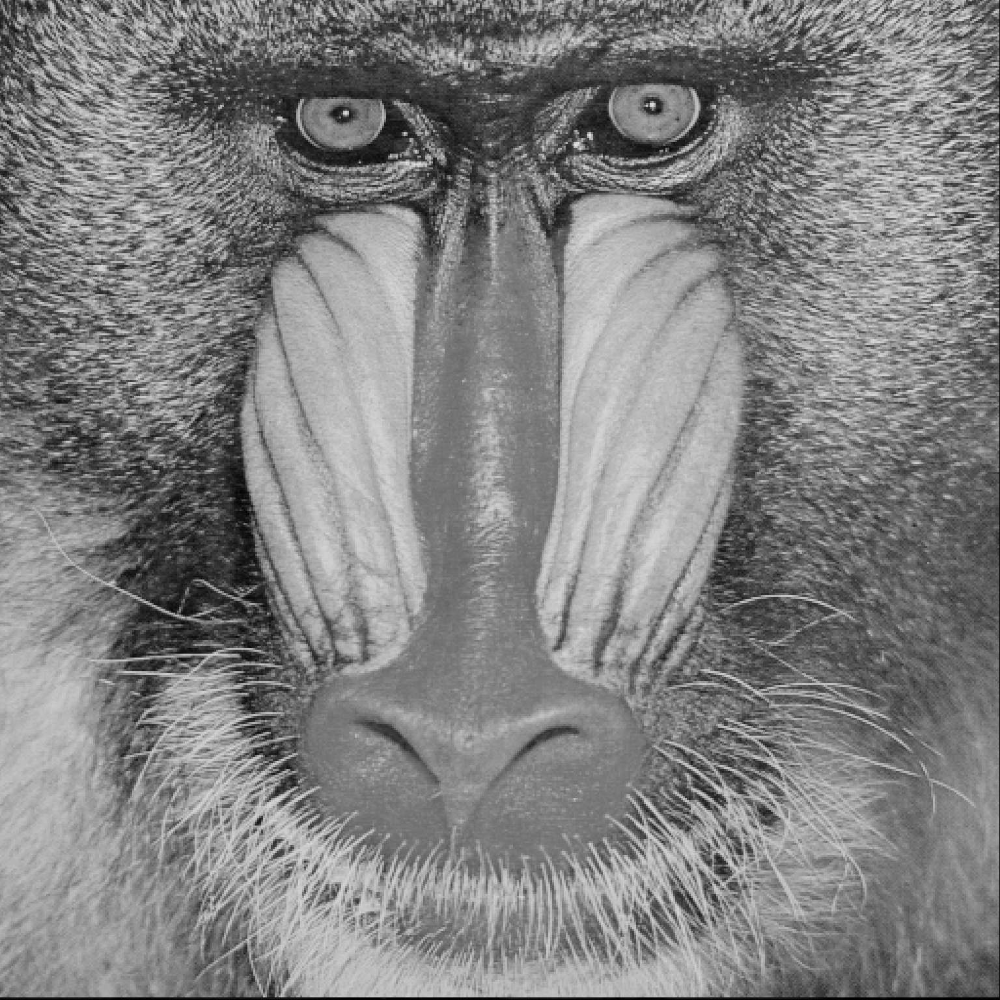

In [ ]:
nearest_3 = scale_interpolation.factor_scale(images['baboon'], 3, "nearest_neighbor")
print(f"Imagem tem dimensões {nearest_3.shape} e tons de cinza armazenados em inteiros {nearest_3.dtype}")
cv2_imshow(nearest_3)

A imagem obtida tem as dimensões esperadas, apresenta conteúdo adequado, com alto efeito de serrilhamento, como esperado do método adotado, uma vez que não há suavização de acordo com o aumento de escala.

Imagem tem dimensões (1536, 1536) e tons de cinza armazenados em inteiros uint8


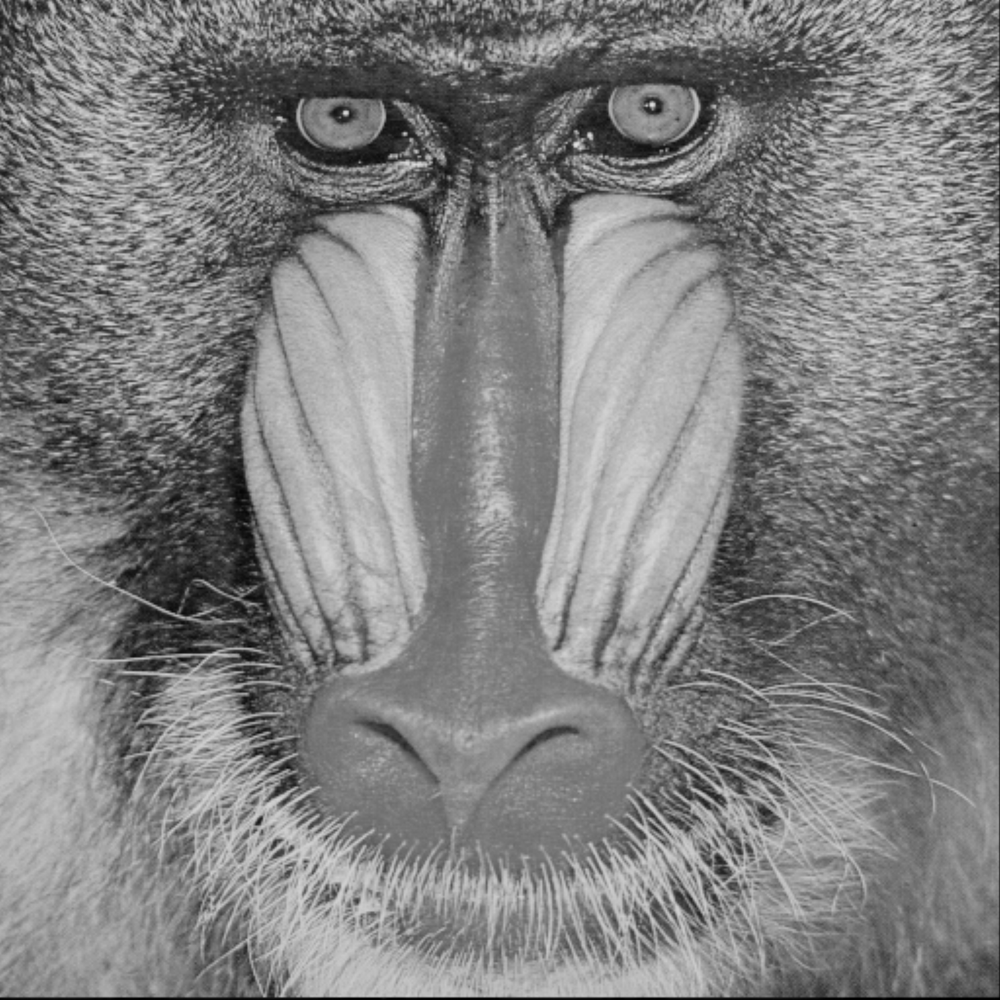

In [ ]:
bilinear_3 = scale_interpolation.factor_scale(images['baboon'], 3, "bilinear")
print(f"Imagem tem dimensões {bilinear_3.shape} e tons de cinza armazenados em inteiros {bilinear_3.dtype}")
cv2_imshow(bilinear_3)

A imagem obtida tem um efeito de suavização maior e boa acurácia com relação a imagem original, com menor serrilhamento que o método anterior.

Imagem tem dimensões (1536, 1536) e tons de cinza armazenados em inteiros uint8


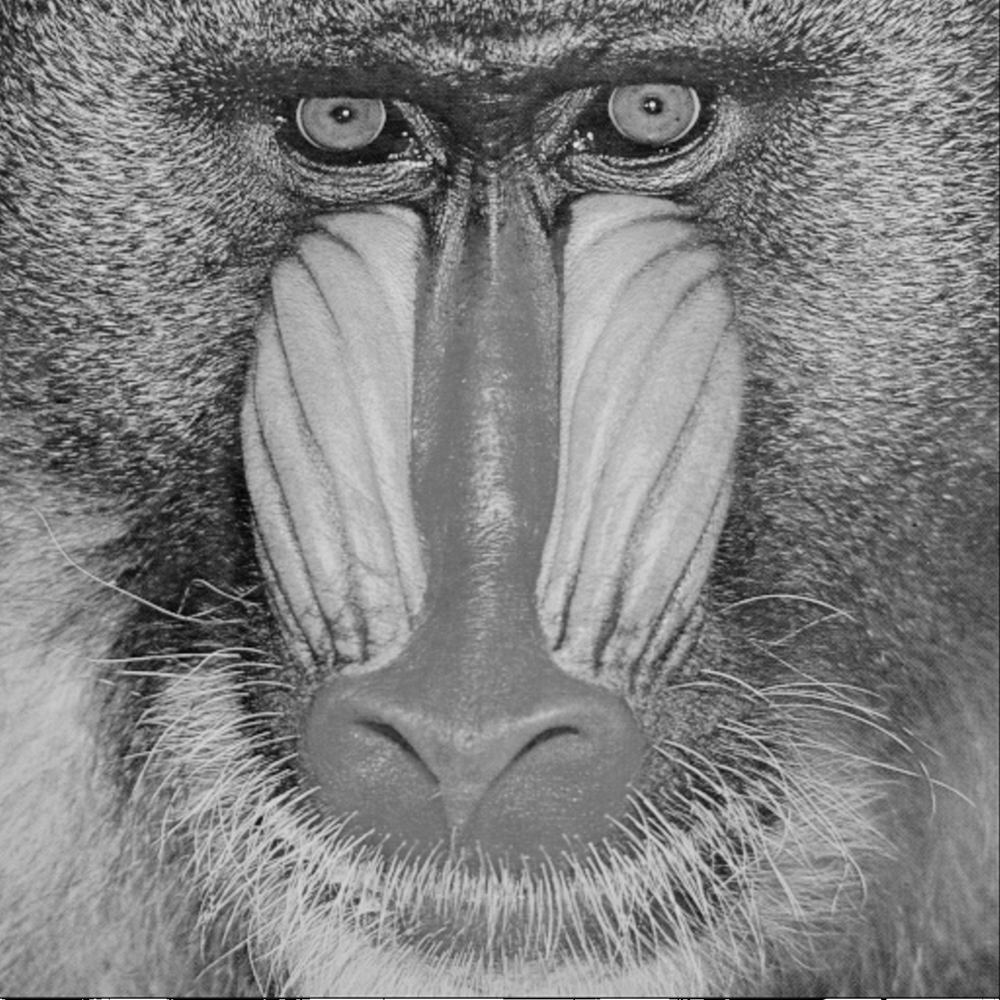

In [ ]:
bicubic_3 = scale_interpolation.factor_scale(images['baboon'], 3, "bicubic")
print(f"Imagem tem dimensões {bicubic_3.shape} e tons de cinza armazenados em inteiros {bicubic_3.dtype}")
cv2_imshow(bicubic_3)

A imagem apresenta ótimo qualidade, baixo serrilhamento e baixo borramento. Entretanto, há um efeito de borda peculiar na borda inferior, no qual alguns pixeis que deveriam ser escuros aparecem brancos.

Imagem tem dimensões (1536, 1536) e tons de cinza armazenados em inteiros uint8


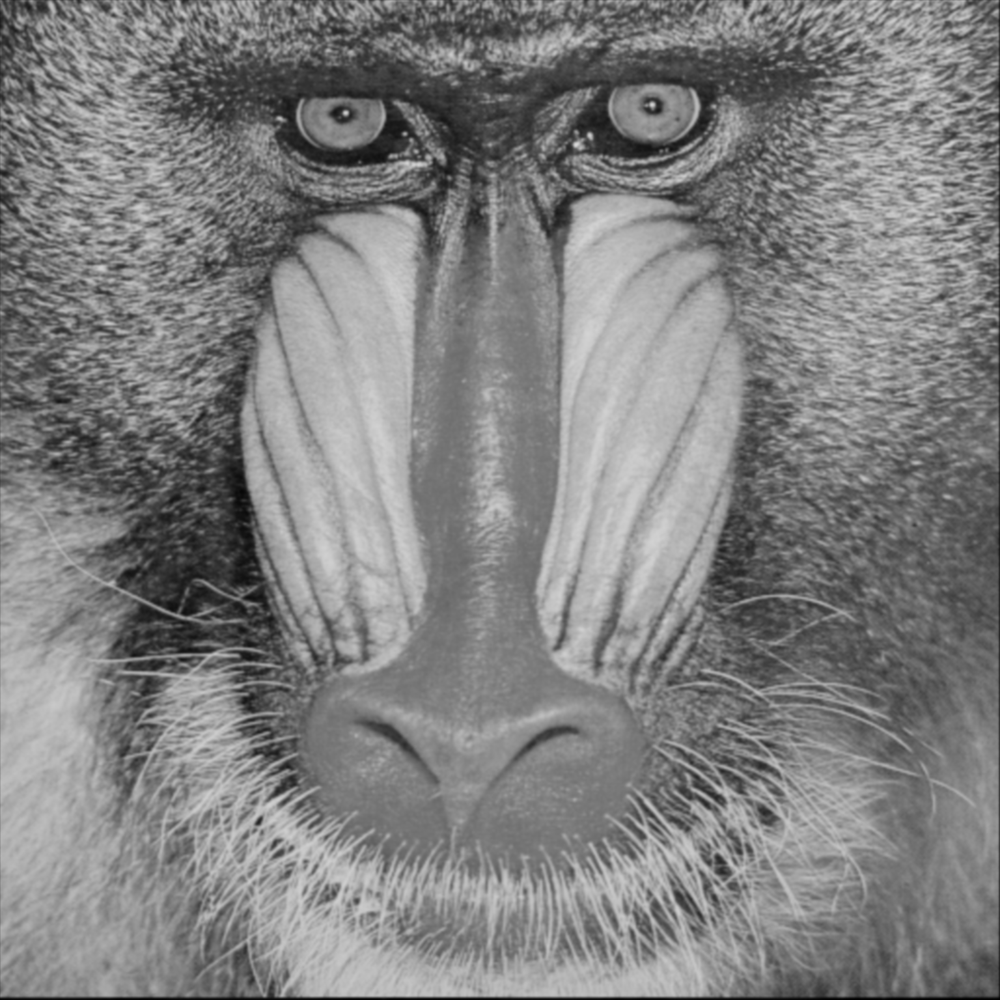

In [ ]:
lagrange_3 = scale_interpolation.factor_scale(images['baboon'], 3, "lagrange")
print(f"Imagem tem dimensões {lagrange_3.shape} e tons de cinza armazenados em inteiros {lagrange_3.dtype}")
cv2_imshow(lagrange_3)

A imagem apresenta boa qualidade, com o menor serrilhamento, porém com borramento notável.

Imagem tem dimensões (256, 256) e tons de cinza armazenados em inteiros uint8


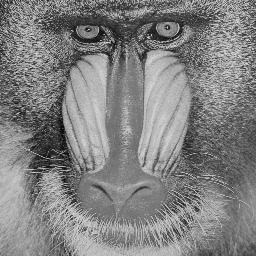

In [ ]:
bicubic_05 = scale_interpolation.factor_scale(images['baboon'], 0.5, "bicubic")
print(f"Imagem tem dimensões {bicubic_05.shape} e tons de cinza armazenados em inteiros {bicubic_05.dtype}")
cv2_imshow(bicubic_05)

In [ ]:
images["watch"] = scale_interpolation.factor_scale(images['watch'], 0.4, "bicubic")

Imagem tem dimensões (307, 409) e tons de cinza armazenados em inteiros uint8


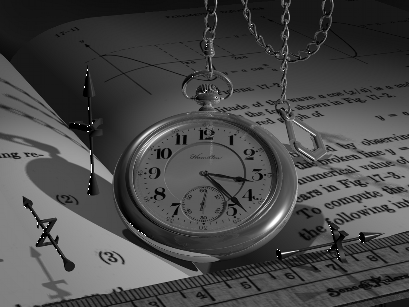

In [ ]:
print(f"Imagem tem dimensões {images['watch'].shape} e tons de cinza armazenados em inteiros {images['watch'].dtype}")
cv2_imshow(images["watch"])

A imagem foi redimensionada corretament, mantendo as proporções. O método de interpolação bicubico permanece bastante competitivo com relação ao critério qualidade e apresenta boa performance de tempo de execução devido ao tamanho pequeno da imagem.

###### Escala através da definição das novas dimensões

Imagem tem dimensões (240, 426) e tons de cinza armazenados em inteiros uint8


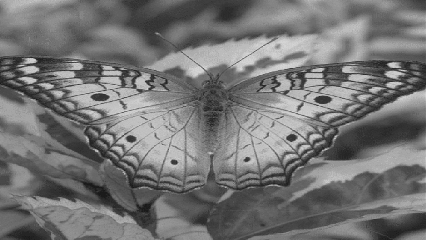

In [ ]:
bicubic_butterfly = scale_interpolation.dimensions_scale(images['butterfly'], 426, 240, "bicubic")
print(f"Imagem tem dimensões {bicubic_butterfly.shape} e tons de cinza armazenados em inteiros {bicubic_butterfly.dtype}")
cv2_imshow(bicubic_butterfly)

A imagem foi redimensionada de acordo com as expectativas. Ou seja, largura de 426 pixeis e altura de 240 pixeis. A imagem também apresenta boa representação da imagem original abaixo.

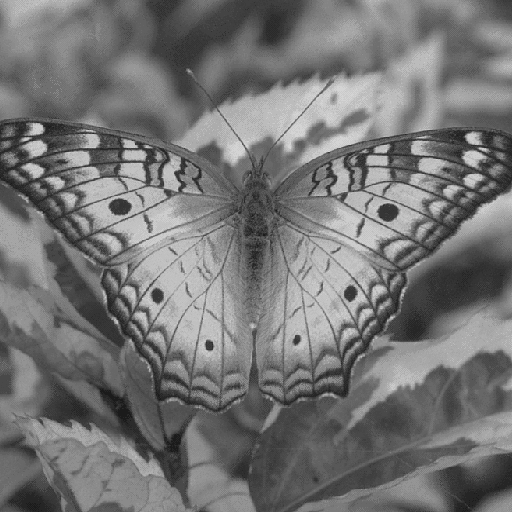

In [ ]:
cv2_imshow(images['butterfly'])

Imagem tem dimensões (360, 640) e tons de cinza armazenados em inteiros uint8


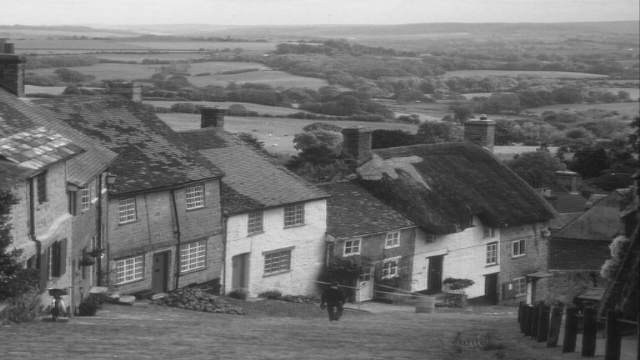

In [ ]:
bilinear_city = scale_interpolation.dimensions_scale(images['city'], 640, 360, "bilinear")
print(f"Imagem tem dimensões {bilinear_city.shape} e tons de cinza armazenados em inteiros {bilinear_city.dtype}")
cv2_imshow(bilinear_city)

A imagem foi redimensionada de acordo com as expectativas. Ou seja, largura de 640 pixeis e altura de 360 pixeis.

Imagem tem dimensões (480, 854) e tons de cinza armazenados em inteiros uint8


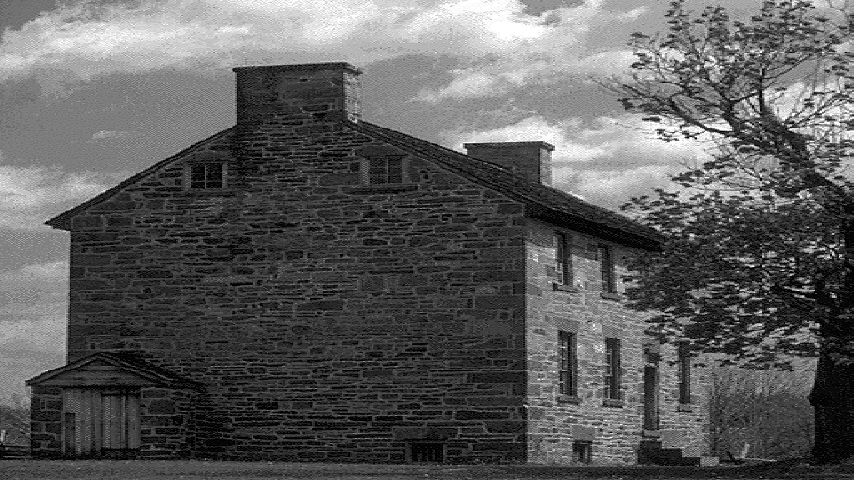

In [ ]:
nearest_house = scale_interpolation.dimensions_scale(images['house'], 854, 480, "nearest_neighbor")
print(f"Imagem tem dimensões {nearest_house.shape} e tons de cinza armazenados em inteiros {nearest_house.dtype}")
cv2_imshow(nearest_house)

A imagem foi redimensionada de acordo com as expectativas. Ou seja, largura de 854 pixeis e altura de 480 pixeis. A imagem também apresenta boa representação da imagem original abaixo. Me estranharam os padrões quadrados em regiões da imagem, mas já estavam presentes na imagem original.

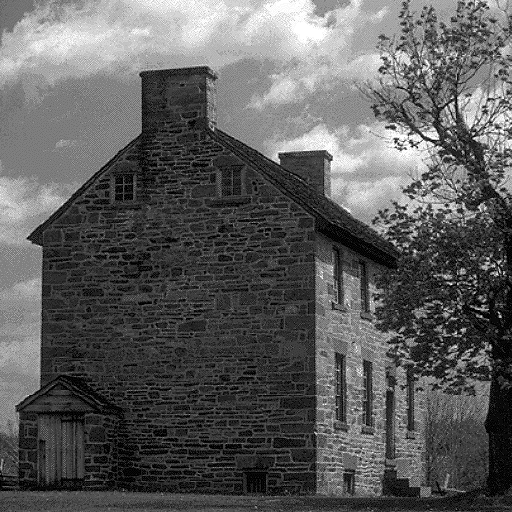

In [ ]:
cv2_imshow(images['house'])

Imagem tem dimensões (720, 1280) e tons de cinza armazenados em inteiros uint8


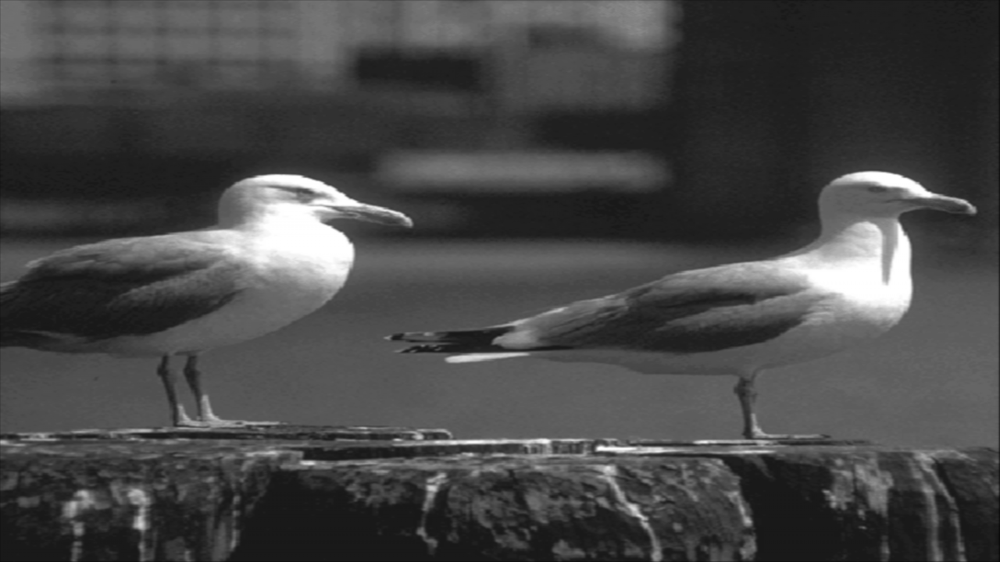

In [ ]:
lagrange_seagull = scale_interpolation.dimensions_scale(images['seagull'], 1280, 720, "lagrange")
print(f"Imagem tem dimensões {lagrange_seagull.shape} e tons de cinza armazenados em inteiros {lagrange_seagull.dtype}")
cv2_imshow(lagrange_seagull)

Novamente, a imagem final atendeu aos requisitos espaciais e de interpolação da transformação.

###### Análise de dados e conclusões

**Fator de escala**

É relevante notar que todas as imagens parecem bem comportadas, indicando que houve um redimensionamento correto, visto que uma imagem (512x512), após escala 3, deve resultar em uma imagem (1536x1536). Demais comportamentos da trasnformação espacial serão avaliados na seção de dimensões.

Com relação à interpolação de níveis de cinza, as imagens mantém a aparência original. Excessões são:

- A interpolação bicúbica introduziu alguns píxeis brancos no limite inferior, provavelmente devido a efeitos de borda. Para mitigar este efeito, pode-se considerar a possibilidade de implementar alguma política diferente para estes casos de borda.

Temos 2 critérios principais para a análise:

1. Qualidade: tal análise será feita através de percepção subjetiva.
2. Performance: tal análise será feita através do tempo necessário para executar o código no google colab, de modo que estará sujeito a variações do serviço, mas ainda servirá como um benchmark aproximado.

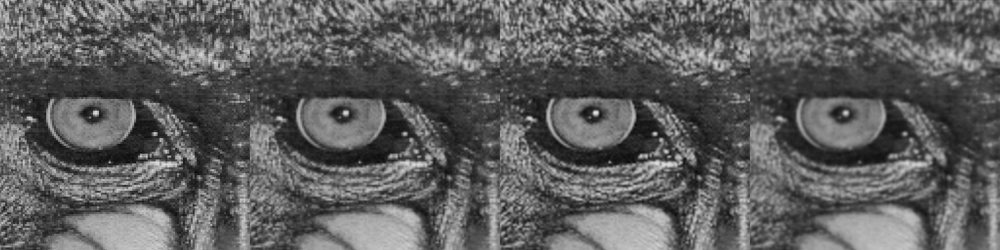

In [ ]:
min_y = 0
max_y = lagrange_3.shape[0]//4

min_x = lagrange_3.shape[1]//4
max_x = 2 * lagrange_3.shape[1]//4

collage = np.hstack((nearest_3[min_y:max_y,min_x:max_x], bilinear_3[min_y:max_y,min_x:max_x], bicubic_3[min_y:max_y,min_x:max_x], lagrange_3[min_y:max_y,min_x:max_x]))
cv2_imshow(collage)

Na imagem acima, temos o recorte do olho esquerdo do babuíno, para mesma escala (3x) utilizando os métodos de interpolação pelo vizinho mais próximo, bilinear, bicúbica e polinômios de Lagrange, da esquerda para a direita.

Observando os contornos do olho, é possível notar que o pixelamento foi gradualmente reduzido da direita para a esquerda. Ou seja, o ranqueamento com relação ao pixelamento, é:

1. polinômios de Lagrange
2. bicúbica
3. bilinear
4. vizinho mais próximo

Entretanto, há de se notar que houve um efeito de borramento ou suavização bastante forte no método por polinômios de Lagrange. De forma que, ao comparar com a imagem original abaixo, é possível afirmar que a interpolação bicúbica foi a que melhor representou o conteúdo original.

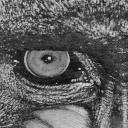

In [ ]:
min_y = 0
max_y = images["baboon"].shape[0]//4

min_x = images["baboon"].shape[1]//4
max_x = 2 * images["baboon"].shape[1]//4

cv2_imshow(images["baboon"][min_y:max_y,min_x:max_x])

Ainda sobre a qualidade da interpolação, a comparação com os resultados esperados teóricamentes e os exemplos vistos em sala de aula exibidos abaixo, podemos afirmar que as implementações foram bem-sucedidas.

Os tempos de execução médios obtidos para essa operação de escala 3x da imagem do babuíno, em específico, foram aproximadamente:

1. vizinho mais próximo: 32s
2. bilinear: 66s
3. bicúbica: 167s
4. polinômios de Lagrange: 376s

Desse modo, uma interpretação possível a cerca dos critérios de avaliação levantados pode ser de que deve-se utilizar:

- Interpolação pelo vizinho mais próximo apenas se o tempo de execução for central.
- Interpolação bilinear caso desejar uma boa relação entre qualidade e tempo.
- Interpolação bicúbica se a qualidade da imagem final for central.

É importante notar que essa análise se restringe à implementação aqui apresentada, de modo que implementações otimizadas destes algoritmos podem sugerir outras conclusões.

**Definição das novas dimensões**

Os resultados utilizando o método de definição das novas dimensões reforçaram as análises anteriores com relação aos métodos de interpolação e confirmaram a corretude da transformação espacial adotada.

##### Rotação

A matriz de trasnformação espacial para a rotação é dada por:

$
T_e
=
\left(\begin{array}{cc}
cos(\theta) && -sen(\theta) && 0 \\
sen(\theta) && cos(\theta) && 0 \\
0 && 0 && 1
\end{array}\right)
$

Porém, ao rotacionar ao redor da origem (0, 0), a imagem original não aparecerá completamente na nova imagem. Dessa forma, fazemos uma reescala considerando o espaço necessário para que a imagem rotacionada caiba em uma nova imagem retângular e transladamos a nova imagem para o centro deste novo retângulo.

De forma que a nova matriz de transformação espacial será dada por:

$
T_e
=
\left(\begin{array}{cc}
cos(\theta) && -sen(\theta) && D_{x} \\
sen(\theta) && cos(\theta) && D_{y} \\
0 && 0 && 1
\end{array}\right)
$

De forma que $D_{x}$ e $D_{y}$ serão calculados, através de trigonometria, para cada quadrante:

1. $0<=Q_1<=90$
2. $90<Q_2<=180$
3. $180<Q_3<=270$
4. $270<Q_4<=360$

In [ ]:
import math

class RotateInterpolation:
    def displacement(self, theta_radian: float, original_shape: Tuple[int, int]) -> Tuple[float, float]:
        y_size, x_size = original_shape
        if theta_radian <= (math.pi / 2):
            displacement_x = np.cos((math.pi/2) - theta_radian) * y_size
            displacement_y = 0
        elif theta_radian <= math.pi:
            displacement_x = np.cos(math.pi - theta_radian) * x_size + np.cos(theta_radian - (math.pi/2)) * y_size
            displacement_y = np.sin(theta_radian - (math.pi / 2)) * y_size
        elif theta_radian <= (3 * math.pi / 2):
            displacement_x = np.cos(theta_radian - math.pi) * x_size
            displacement_y = np.sin((3 * math.pi / 2) - theta_radian) * y_size + np.sin(theta_radian - math.pi) * x_size
        else:
            displacement_x = 0
            displacement_y = np.sin(2 * math.pi - theta_radian) * x_size

        return displacement_x, displacement_y

    def rotate_transform(self, theta_radian: float, original_shape: Tuple[int, int]) -> npt.NDArray:
        displacement_x, displacement_y = self.displacement(theta_radian, original_shape)

        cos_theta = np.cos(theta_radian)
        sin_theta = np.sin(theta_radian)

        return np.array(
            [
                [cos_theta,-sin_theta,displacement_x],
                [sin_theta,cos_theta,displacement_y],
                [0,0,1],
            ]
        )

    def rotate_map_transform(self, theta_radian: float, original_shape: Tuple[int, int]) -> npt.NDArray:
        return np.linalg.inv(self.rotate_transform(theta_radian, original_shape))

    def new_shape(self, original_shape: Tuple[int, int], theta_radian: float) -> Tuple[int, int]:
        theta_complement = (math.pi/2) - theta_radian
        y_size, x_size = original_shape
        new_y_size = int(abs(np.sin(theta_radian)) * x_size + abs(np.sin(theta_complement)) * y_size)
        new_x_size = int(abs(np.cos(theta_radian)) * x_size + abs(np.cos(theta_complement)) * y_size)

        return (new_y_size, new_x_size)

    def theta_radian(self, theta: float) -> float:
        # Keep angles within 0-360 degrees
        theta_norm = theta % 360
        # Use angles counter-clockwise
        theta_anti = 360 - theta_norm

        return np.deg2rad(theta_anti)

    def rotate(self, image: npt.NDArray, theta: float, method: str = "nearest_neighbor") -> npt.NDArray:
        theta_radian = self.theta_radian(theta)
        new_shape = self.new_shape(image.shape, theta_radian)
        map_transform = self.rotate_map_transform(theta_radian, image.shape)

        algorithm = get_interpolation_function(image, map_transform, method)
        new_image = np.fromfunction(algorithm, new_shape, dtype=np.uint64)

        return new_image.astype(np.uint8)

In [ ]:
rotate_interpolation = RotateInterpolation()

###### Primeiro quadrante

Imagem tem dimensões originais (307, 409) e novas dimensões (470, 507), em tons de cinza armazenados em inteiros uint8


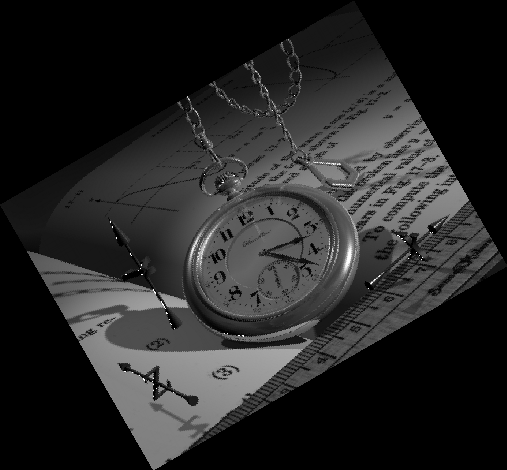

In [ ]:
nearest_watch = rotate_interpolation.rotate(images['watch'], 30, "nearest_neighbor")
print(f"Imagem tem dimensões originais {images['watch'].shape} e novas dimensões {nearest_watch.shape}, em tons de cinza armazenados em inteiros {nearest_watch.dtype}")
cv2_imshow(nearest_watch)

###### Segundo quadrante

Imagem tem dimensões originais (307, 409) e novas dimensões (507, 470), em tons de cinza armazenados em inteiros uint8


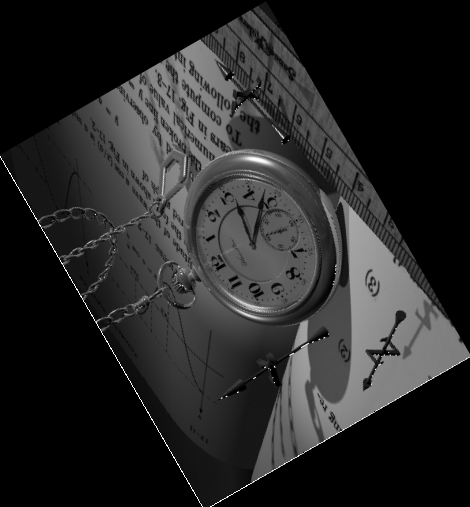

In [ ]:
bilinear_watch = rotate_interpolation.rotate(images['watch'], 120, "bilinear")
print(f"Imagem tem dimensões originais {images['watch'].shape} e novas dimensões {bilinear_watch.shape}, em tons de cinza armazenados em inteiros {bilinear_watch.dtype}")
cv2_imshow(bilinear_watch)

###### Terceiro quadrante

Imagem tem dimensões originais (307, 409) e novas dimensões (507, 470), em tons de cinza armazenados em inteiros uint8


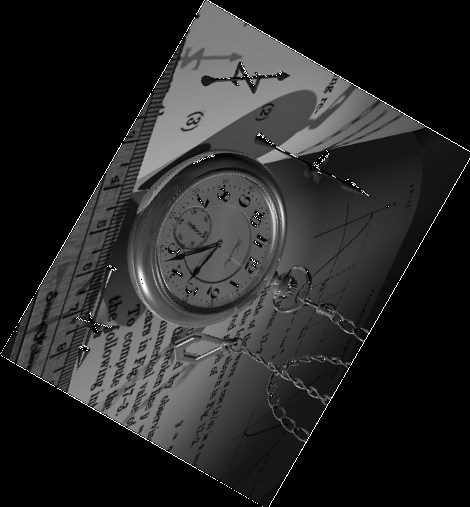

In [ ]:
bicubic_watch = rotate_interpolation.rotate(images['watch'], 240, "bicubic")
print(f"Imagem tem dimensões originais {images['watch'].shape} e novas dimensões {bicubic_watch.shape}, em tons de cinza armazenados em inteiros {bicubic_watch.dtype}")
cv2_imshow(bicubic_watch)

###### Quarto quadrante

Imagem tem dimensões originais (307, 409) e novas dimensões (507, 470), em tons de cinza armazenados em inteiros uint8


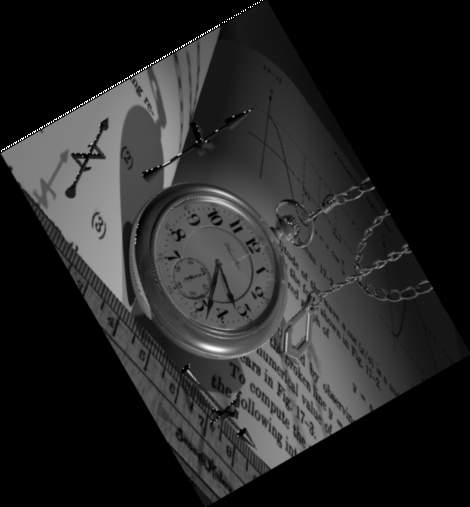

In [ ]:
lagrange_watch = rotate_interpolation.rotate(images['watch'], 300, "lagrange")
print(f"Imagem tem dimensões originais {images['watch'].shape} e novas dimensões {lagrange_watch.shape}, em tons de cinza armazenados em inteiros {lagrange_watch.dtype}")
cv2_imshow(lagrange_watch)

###### Análise de dados e conclusões

A análise da imagem do relógio, rotacionada em ângulos diversos nos quatro quadrantes nos permite concluir que a transformação espacial está sendo corretamente computada de modo a incluir a imagem original, perfeitamente enquadrada em uma imagem retângular de dimensões mínimas. Entretanto, os experimentos exibiram dois problemas:

1. Casos de borda novamente geraram pixeis brancos em regiões que deveriam ser escura para os métodos de vizinhança 16.

2. Houveram pixeis brancos em regiões escuras centrais na imagem para o método da interpolação bicúbica no terceiro quadrante, indicado que possivelmente está acontecendo overflow. Este efeito necessitaria ser mais profundamente investigado para uma conclusão definitiva e possível proposta de solução.

### 1. Registro de imagens

O registro de imagens é o processo de correspondencia ou alinhamento entre imagens.

É possível encontrar na literatura múltiplas abordagens para esta tarefa, de modo que não existe técnica genérica que performe bem em todos os cenários, visto que em diferentes domínios, imagens estão sujeitas a diferentes distorções e aplicações podem requerer diferentes precisões.

O objetivo desta etapa do trabalho é aplicar técnicas de registro de imagens, de maneira a detectar pontos de interesse entre duas imagens e gerar uma imagem panorâmica com a junção das duas imagens sob análise.

#### Metodologia

O processo de detecção de pontos de interesse se dará através se dará através de um conjunto de medidas de similaridade baseada em descritores das imagens.

Dados pontos de interesse, imagens panorâmicas serão geradas através da redefinição das coordenadas de uma das imagens e da interpolação de seus níveis de cinza.

Dessa forma, trabalharemos apenas com imagens em niveis de cinza.

Os passos mais importantes serão:

1. Aplicar descritores clássicos nas imagens e utilizá-los para detecar pontos de interesse.
2. Aplicar medidas de distância ou similaridade e utilizá-las para determinar boas correspondências entre as imagens.
3. Desenhar retas correspondentes no par de imagens.
4. Encontrar uma matriz de homografia que mapeia uma das imagens no plano projetivo da outra através de transformações geométricas.
5. Aplicar uma projeção perspectiva para alinhar as imagens.
6. Unir as imagens alinhadas de acordo com as correspondências encontradas.

#### Imagens

Iremos utilizar imagens fornecidas pelo professor no seu repositório [imagens_registro](https://www.ic.unicamp.br/~helio/imagens_registro/).

In [3]:
# Carregando imagem do drive em escala de cinza
images = {
    "foto1A": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1A.jpg", cv2.IMREAD_GRAYSCALE),
    "foto1B": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1B.jpg", cv2.IMREAD_GRAYSCALE),
    "foto2A": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto2A.jpg", cv2.IMREAD_GRAYSCALE),
    "foto2B": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto2B.jpg", cv2.IMREAD_GRAYSCALE),
    "foto3A": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto3A.jpg", cv2.IMREAD_GRAYSCALE),
    "foto3B": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto3B.jpg", cv2.IMREAD_GRAYSCALE),
    "foto4A": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto4A.jpg", cv2.IMREAD_GRAYSCALE),
    "foto4B": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto4B.jpg", cv2.IMREAD_GRAYSCALE),
    "foto5A": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto5A.jpg", cv2.IMREAD_GRAYSCALE),
    "foto5B": cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto5B.jpg", cv2.IMREAD_GRAYSCALE),
}

for name, image in images.items():
    print(f"Imagem `{name}` tem dimensões {image.shape} e tons de cinza armazenados em inteiros {image.dtype}")

Imagem `foto1A` tem dimensões (683, 1024) e tons de cinza armazenados em inteiros uint8
Imagem `foto1B` tem dimensões (683, 1024) e tons de cinza armazenados em inteiros uint8
Imagem `foto2A` tem dimensões (709, 816) e tons de cinza armazenados em inteiros uint8
Imagem `foto2B` tem dimensões (710, 818) e tons de cinza armazenados em inteiros uint8
Imagem `foto3A` tem dimensões (427, 640) e tons de cinza armazenados em inteiros uint8
Imagem `foto3B` tem dimensões (427, 640) e tons de cinza armazenados em inteiros uint8
Imagem `foto4A` tem dimensões (411, 480) e tons de cinza armazenados em inteiros uint8
Imagem `foto4B` tem dimensões (439, 480) e tons de cinza armazenados em inteiros uint8
Imagem `foto5A` tem dimensões (427, 640) e tons de cinza armazenados em inteiros uint8
Imagem `foto5B` tem dimensões (427, 640) e tons de cinza armazenados em inteiros uint8


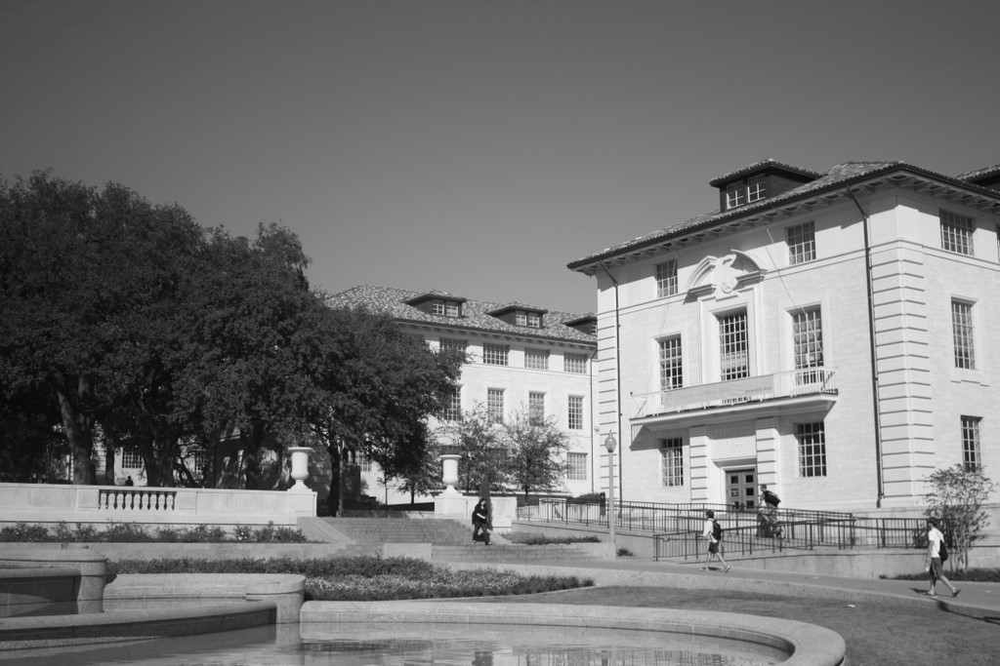

In [4]:
cv2_imshow(images["foto1A"])

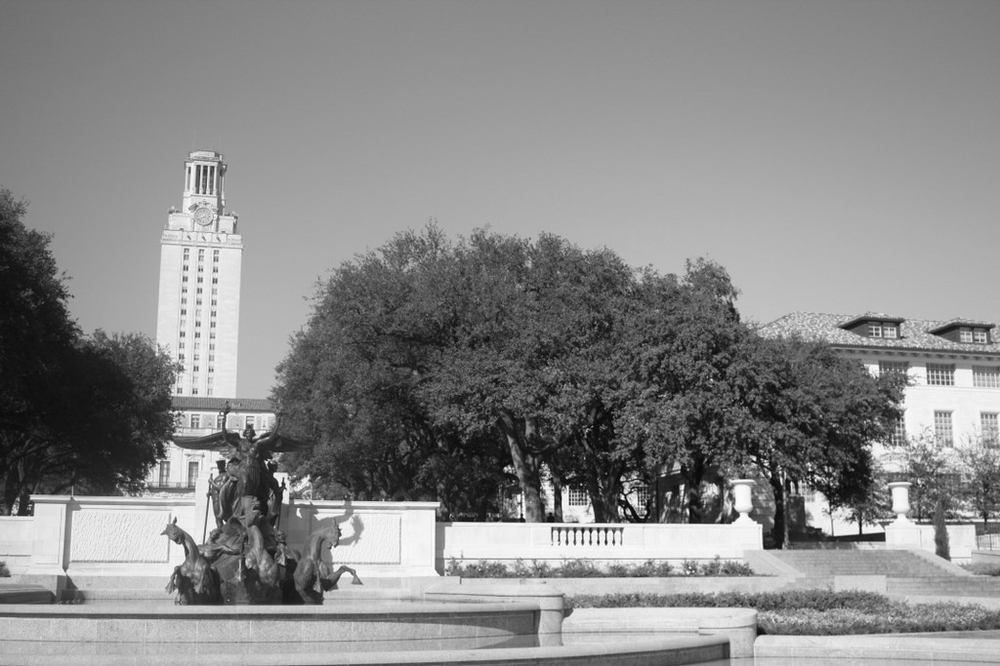

In [5]:
cv2_imshow(images["foto1B"])

As imagens acima são exemplos de imagens com correpondência. O olhar humano atento facilmente encontraria uma correspondência entre as árvores, a escadaria e o prédio dentral na primeira imagem, porém no canto direito na segunda.

#### Experimentos

##### SIFT

A técnica de descrição de imagens Scale-Invariant Feature Transform tem por objectivo encontrar pontos de interesse em imagens e descrevê-los de maneira invariante com relação a escala.

Os pontos de interesse são encontrados através de máximos locais em uma função de diferença de Gaussianas variando-se janelas (escalas). A descrição adotada tem como principais componentes a localização do ponto de interesse, a escala relativa e a orientação da região descrita pelo ponto de interesse, de modo que é uma descrição invariante com relação a escala e rotação, duas características de muito interesse no conteto de registro de imagens.

In [6]:
image_colored = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1A.jpg", cv2.IMREAD_COLOR)
image_grayscale = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1A.jpg", cv2.IMREAD_GRAYSCALE)

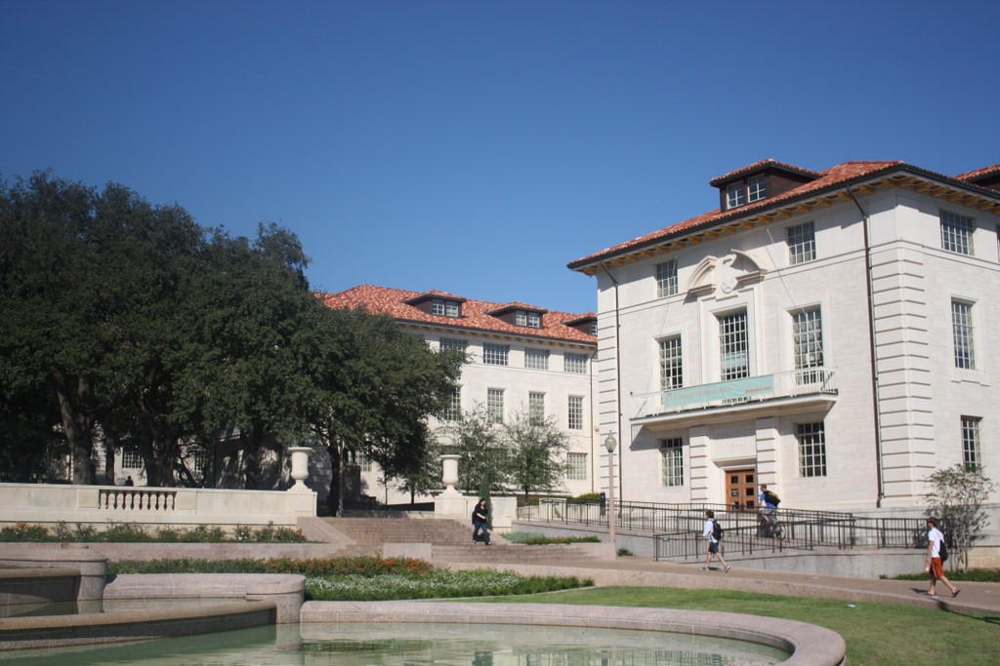

In [7]:
cv2_imshow(image_colored)

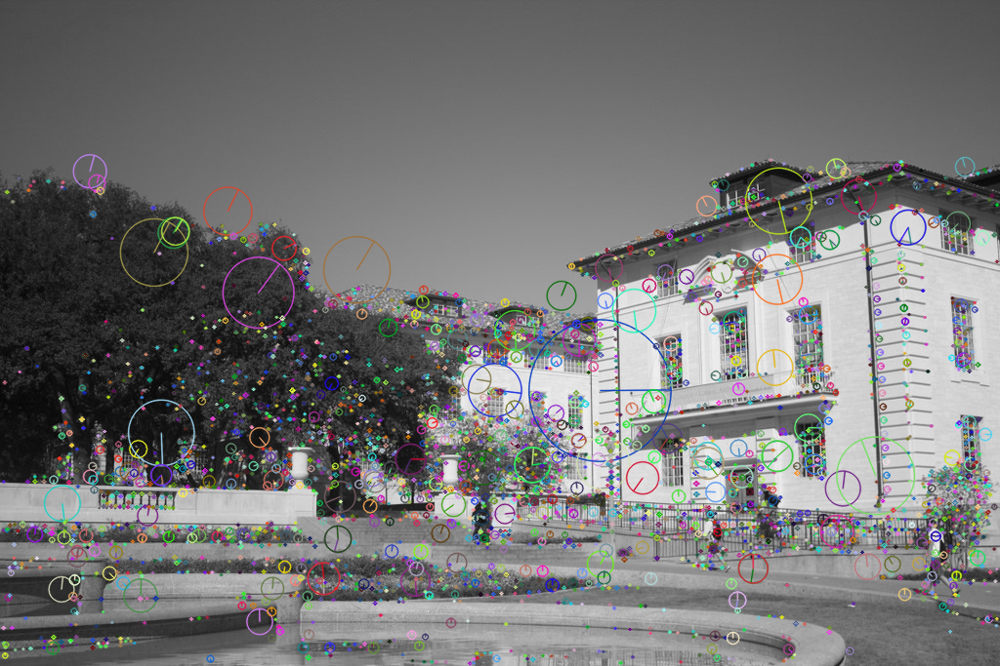

In [8]:
sift = cv2.SIFT_create()
keypoints = sift.detect(image_grayscale,None)

image_drawn = cv2.drawKeypoints(image_grayscale,keypoints,image_colored,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2_imshow(image_drawn)

Utilizando a biblioteca opencv, detectando os pontos de interesse e pintando na tela, podemos observar a localização como o centro dos círculos desenhados, a escala como o tamanho do raio destes círculos e a orientação como o grau no círculo trigonométrico indicado pela semireta que vai do centro do círculo até a extremidade.

Esta descrição parece bastante abstrata a primeira vista, mas quando comparamos com o resultado obtido ao aplicar a mesma técnica na imagem correspondente, será possível identificar pontos em comum.

In [9]:
image_colored = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1B.jpg", cv2.IMREAD_COLOR)
image_grayscale = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1B.jpg", cv2.IMREAD_GRAYSCALE)

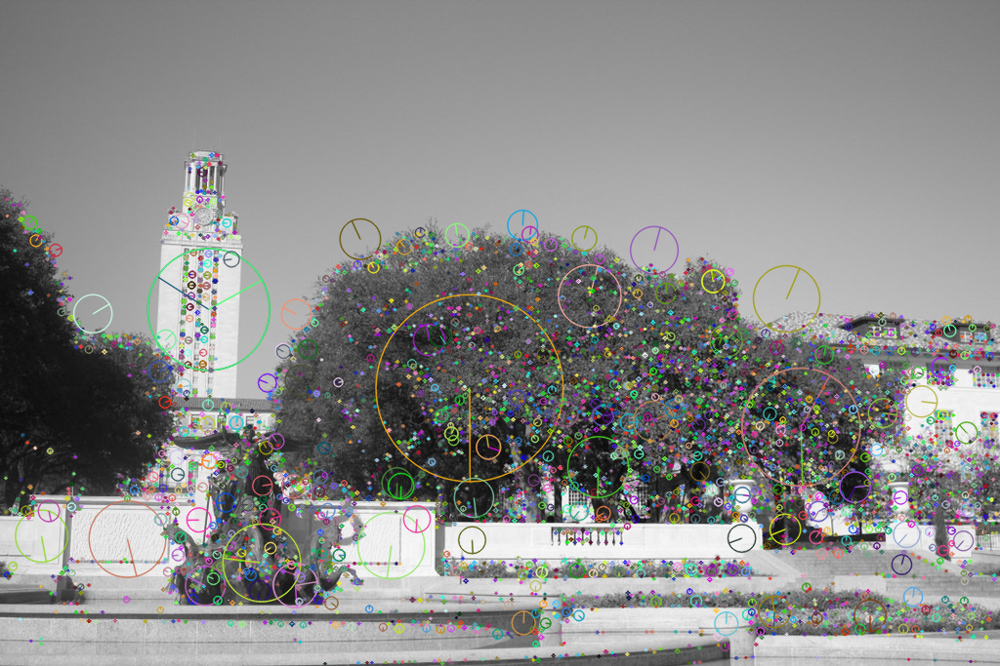

In [10]:
sift = cv2.SIFT_create()
keypoints = sift.detect(image_grayscale,None)

image_drawn = cv2.drawKeypoints(image_grayscale,keypoints,image_drawn,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2_imshow(image_drawn)

É possível notar, por exemplo, pontos de interesse de mesma orientação no topo das árvores, nas pilastras da escadaria e nas janelas superiores do prédio.

A próxima etapa é encontrar as melhores correspondências.

Iremos utilizar a medida de distância entre descritores [cv.NORM_L2](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ggad12cefbcb5291cf958a85b4b67b6149fa7bacbe84d400336a8f26297d8e80e3a2), padrão da biblioteca que é indicada como aderente à técnica de descrição SIFT.

Utilizando então um matcher, ou seja, um objeto de detecção de correspondências, buscaremos as melhores correspondências segunda essa medida.

Aqui utilizaremos a imagem b como referência de maneira que a imagem a fique a direita e complemente a primeira.

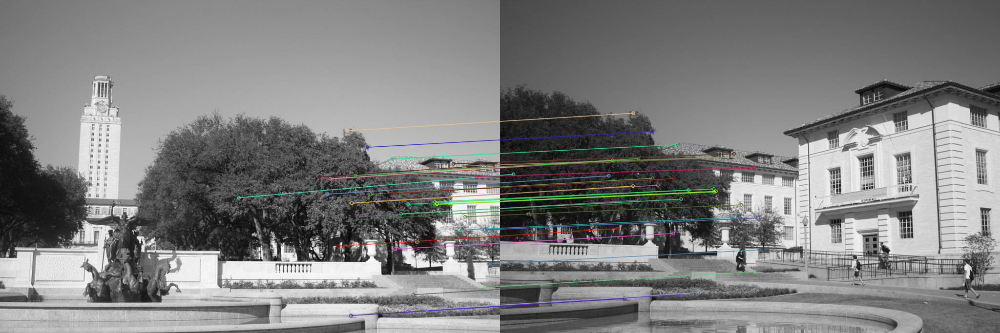

In [54]:
image_a = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1A.jpg", cv2.IMREAD_GRAYSCALE)
image_b = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1B.jpg", cv2.IMREAD_GRAYSCALE)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(image_b, None)
kp2, des2 = sift.detectAndCompute(image_a, None)

# BFMatcher with default params
matcher = cv2.BFMatcher()
matches = matcher.knnMatch(des1, des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    # Esse limiar é muito importante para determinar um conjunto adequado de pontos de interesse
    if m.distance < 0.2 * n.distance:
        good.append([m])

# cv.drawMatchesKnn expects list of lists as matches.
image_good_matches = cv2.drawMatchesKnn(image_b, kp1, image_a, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(image_good_matches)

Após alguns testes, chegamos a um limiar de distância interessante entre pares de pontos que num exame ocular  parecem bastante precisos e capazes de indentificar correspondências como indicadas anteriormente.

A próxima etapa é encontrar a matriz de homografia que permite a transformação projetiva capaz de alinhar as imagens. Para tal, iremos dispor do método RANdom SAmple Consensus (RANSAC) para estimar de através de um algoritmo iterativo os parâmetros da trasnformação afim desejada de acordo com os pontos de correspondência.

In [55]:
good = [m[0] for m in good]

In [56]:
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[n.trainIdx].pt for n in good]).reshape(-1,1,2)
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
matches_mask = mask.ravel().tolist()
height,width = image_b.shape
pts = np.float32([[0,0],[0,height-1],[width-1,height-1],[width-1,0]]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts, H)
image_a_polylines = cv2.polylines(image_a, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
image_a = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto1A.jpg", cv2.IMREAD_GRAYSCALE)

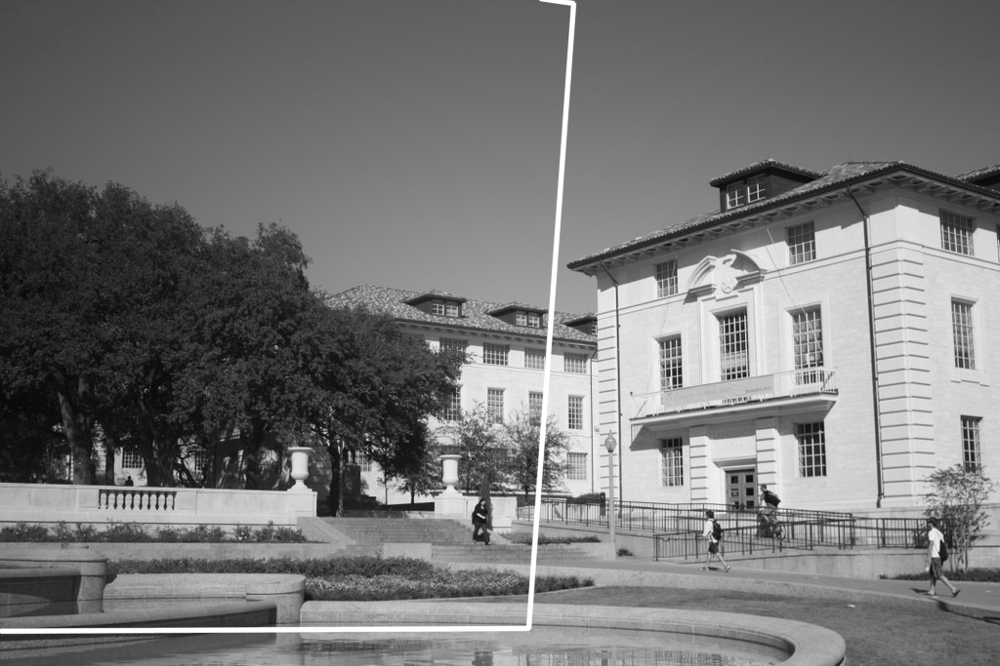

In [57]:
cv2_imshow(image_a_polylines)

Primeiro encontramos os pontos de recorte e pintamos na tela, afim de verificar a correpondencia.

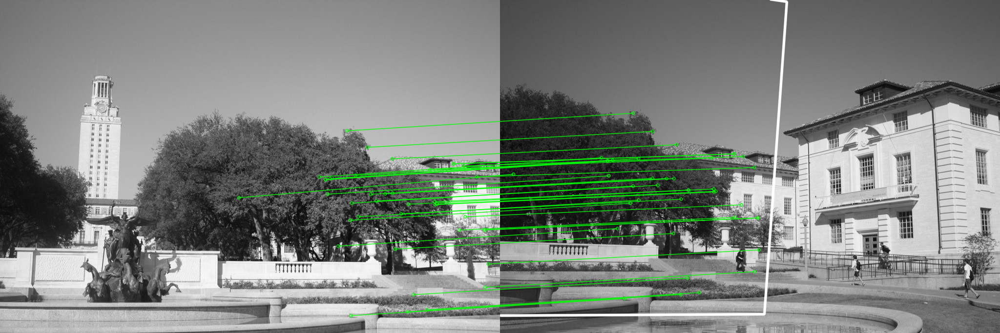

In [58]:
draw_params = dict(matchColor = (0,255,0), # draw matches in green color
    singlePointColor = None,
    matchesMask=matches_mask, # draw only inliers
    flags = 2,
)
both_images_lines_and_polylines = cv2.drawMatches(image_b, kp1, image_a_polylines, kp2, good, None, **draw_params)

cv2_imshow(both_images_lines_and_polylines)

Então encontramos a matriz de transformação e aplicamos à imagem a, de modo a compatibilizá-la com a imagem b.

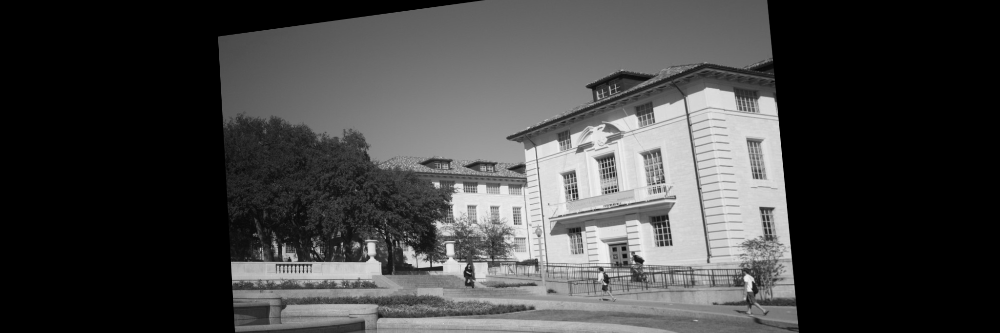

In [69]:
pts1 = dst
pts2 = pts

H = cv2.getPerspectiveTransform(pts1,pts2)

image_a_transformed = cv2.warpPerspective(image_a, H, (image_b.shape[1]+ image_a.shape[1], image_b.shape[0]))

cv2_imshow(image_a_transformed)

Podemos agora selecionar um valor de corte para as coordenadas em x de maneira a gerar a imagem panorâmica através de colagem.

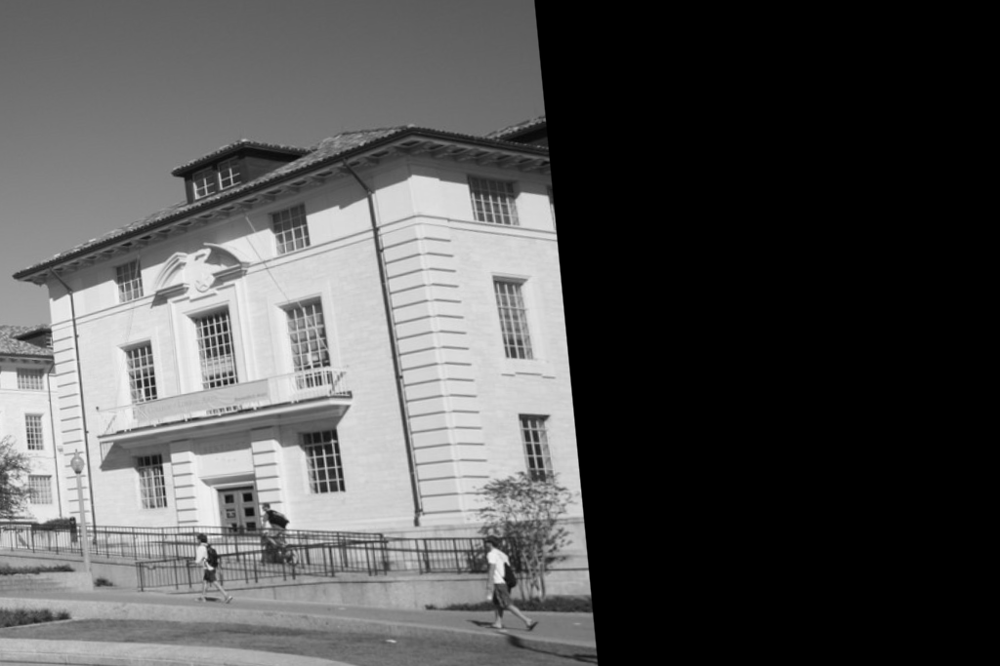

In [80]:
cv2_imshow(image_a_transformed[:,image_b.shape[1]:])

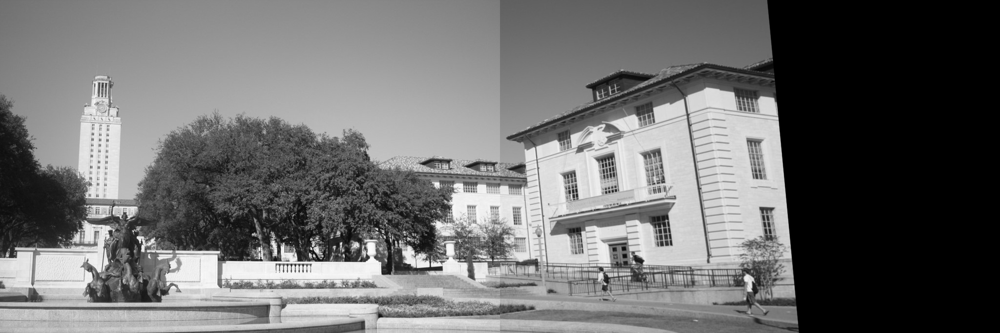

In [82]:
panoramic = np.hstack((image_b, image_a_transformed[:,image_b.shape[1]:]))
cv2_imshow(panoramic)

A imagem foi teve um ótimo alinhamento, porém os níveis de cinza ficaram claramente distintos e pequenas descontinuidades são notadas. Estes são efeitos esperados, dado que as diferentes condições de captura, somado à precisão limitada da tranformação geométrica aplicada não permitem uma melhor adesão.

Agora iremos aplicar a outras duas imagens.

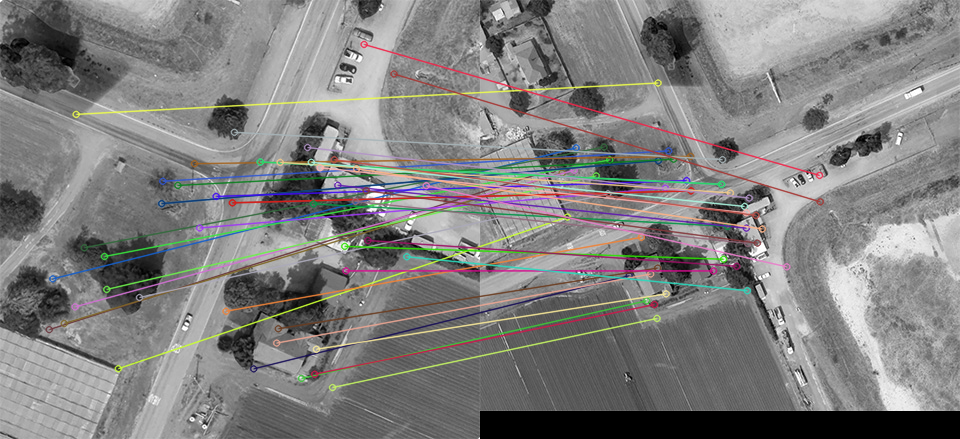

In [86]:
image_a = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto4A.jpg", cv2.IMREAD_GRAYSCALE)
image_b = cv2.imread("/content/drive/MyDrive/MC920/T4/homography/foto4B.jpg", cv2.IMREAD_GRAYSCALE)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(image_b, None)
kp2, des2 = sift.detectAndCompute(image_a, None)

# BFMatcher with default params
matcher = cv2.BFMatcher()
matches = matcher.knnMatch(des1, des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    # Esse limiar é muito importante para determinar um conjunto adequado de pontos de interesse
    if m.distance < 0.13 * n.distance:
        good.append([m])

# cv.drawMatchesKnn expects list of lists as matches.
image_good_matches = cv2.drawMatchesKnn(image_b, kp1, image_a, kp2, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(image_good_matches)

Note que foi necessário reduzir um pouco o limiar de aceitação de correspondências de maneira a selecionar um melhor conjunto. Este processo pode ser otimizado ordenando as correspondências pela sua distância e tomando os X melhores pontos.

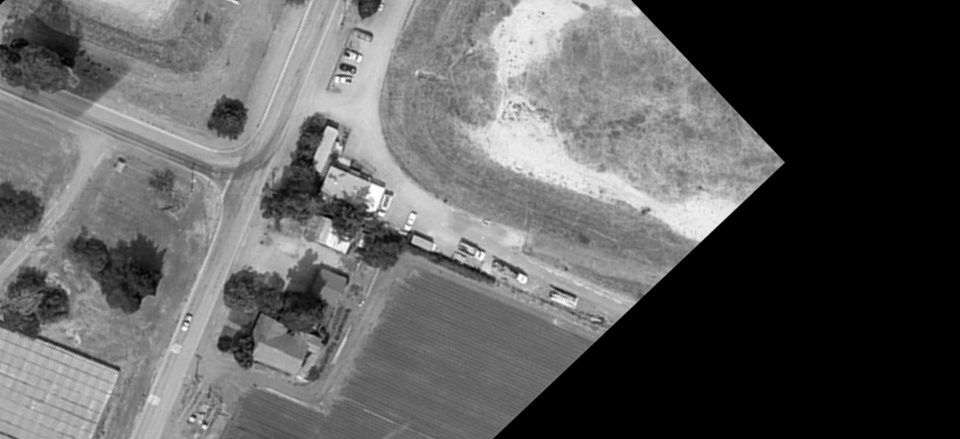

In [87]:
good = [m[0] for m in good]

src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[n.trainIdx].pt for n in good]).reshape(-1,1,2)
M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

height, width = image_b.shape

pts2 = np.float32([[0,0],[0,height-1],[width-1,height-1],[width-1,0]]).reshape(-1,1,2)
pts1 = cv2.perspectiveTransform(pts2, M)

H = cv2.getPerspectiveTransform(pts1,pts2)
image_a_transformed = cv2.warpPerspective(image_a, H, (width + image_a.shape[1], height))

cv2_imshow(image_a_transformed)

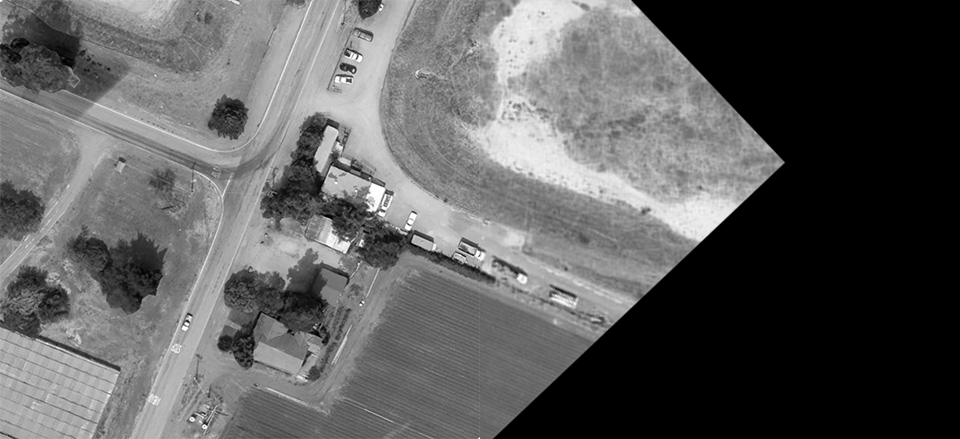

In [88]:
panoramic = np.hstack((image_b, image_a_transformed[:,width:]))
cv2_imshow(panoramic)

Novamente, o descritor SIFT mostrou bons resultados, permitindo um bom alinhamento e uma panorâmica de possível grande valor para tarefas de sensoriamento remoto.

Agora, empacotando de maneira a aplicar mais genéricamente:

In [92]:
class PanoramicCreator:
    def find_matches(self, image_a, image_b):
        # Initiate SIFT detector
        sift = cv2.SIFT_create()

        # Find the keypoints and descriptors with SIFT
        kp1, des1 = sift.detectAndCompute(image_b, None)
        kp2, des2 = sift.detectAndCompute(image_a, None)

        # BFMatcher with default params
        matcher = cv2.BFMatcher()
        matches = matcher.knnMatch(des1, des2, k=2)

        # Apply ratio test
        matches_ratios = [(m, m.distance/n.distance) for m,n in matches]
        good_matches_ratios = sorted(matches_ratios, key=lambda item: item[1])[:20]
        good_matches = [m for m, ratio in good_matches_ratios]

        return kp1, kp2, good_matches

    def transform_image(self, image_a, image_b, kp1, kp2, good_matches):
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
        dst_pts = np.float32([kp2[n.trainIdx].pt for n in good_matches]).reshape(-1,1,2)
        M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        height, width = image_b.shape

        pts2 = np.float32([[0,0],[0,height-1],[width-1,height-1],[width-1,0]]).reshape(-1,1,2)
        pts1 = cv2.perspectiveTransform(pts2, M)

        H = cv2.getPerspectiveTransform(pts1, pts2)
        image_a_transformed = cv2.warpPerspective(image_a, H, (width + image_a.shape[1], height))

        return image_a_transformed

    def panoramic(self, image_a, image_b):
        """
        Creates a panoramic.

        Requires image a to be relatively at the left of image b.
        """
        kp1, kp2, good_matches = self.find_matches(image_a, image_b)
        image_a_transformed = self.transform_image(image_a, image_b, kp1, kp2, good_matches)

        return np.hstack((image_b, image_a_transformed[:,image_b.shape[1]:]))

In [93]:
panoramic_creator = PanoramicCreator()

Aplicando às demais imagens, temos os seguintes resultados:

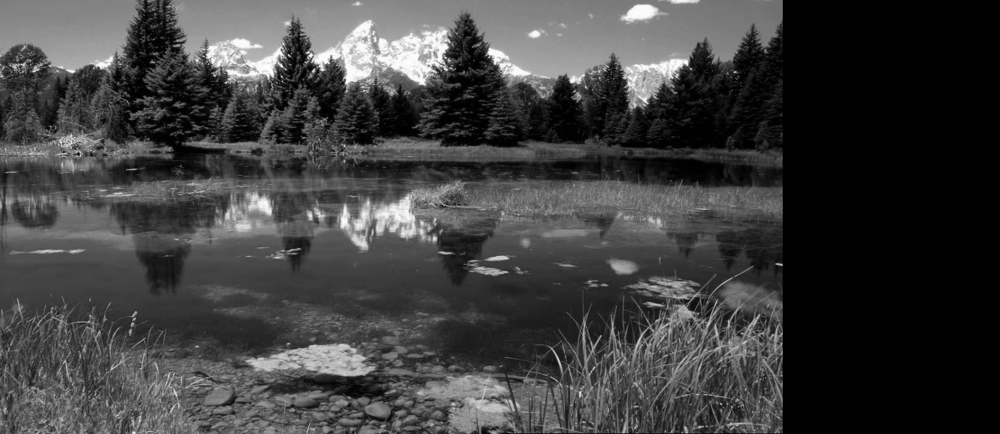

In [95]:
panoramic_2 = panoramic_creator.panoramic(images["foto2A"], images["foto2B"])
cv2_imshow(panoramic_2)

Nesta imagem, obtemos novamente um ótimo resultado, com alto alinhamento e quase nenhuma descontinuidade notável.

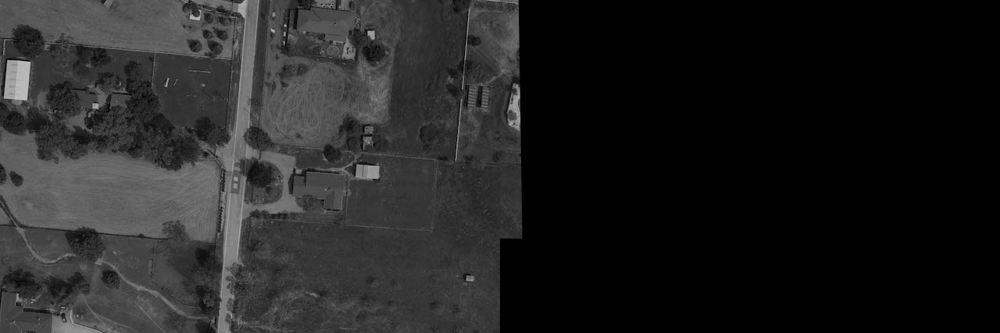

In [96]:
panoramic_3 = panoramic_creator.panoramic(images["foto3A"], images["foto3B"])
cv2_imshow(panoramic_3)

Novamente obtivemos um bom alinhamento, entretanto a panorâmica obtida foi subótima, uma vez que não exploramos o potêncial de expandir a imagem verticalmente.

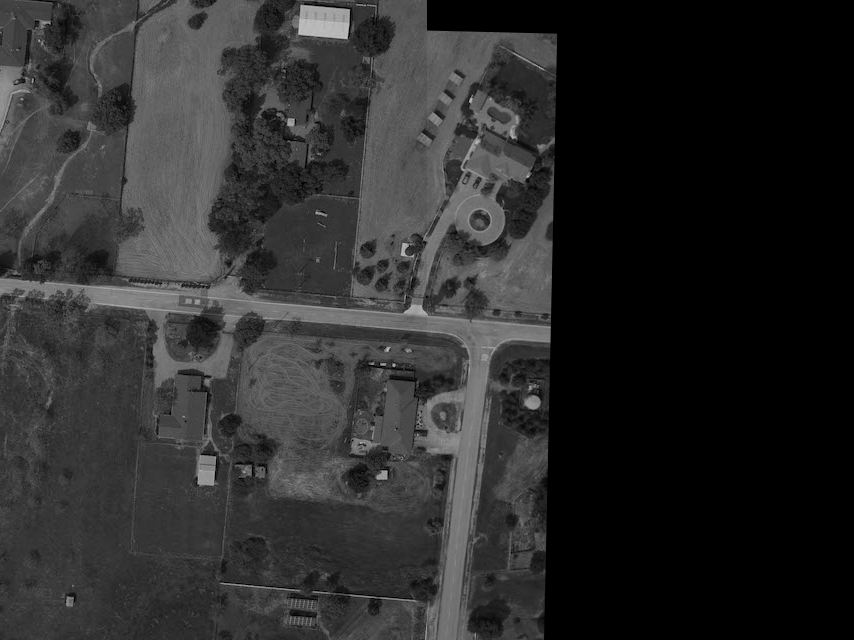

In [98]:
image_a_3 = cv2.rotate(images["foto3A"], cv2.ROTATE_90_CLOCKWISE)
image_b_3 = cv2.rotate(images["foto3B"], cv2.ROTATE_90_CLOCKWISE)
panoramic_3_rotated = panoramic_creator.panoramic(image_a_3, image_b_3)
cv2_imshow(panoramic_3_rotated)

Rotacionando as imagens em sentido adequado antes de efetuar a operação já é capaz de gerar resultados interessantescomo previsto. Entretanto, seria interessante tornar a ferramenta robusta a rotação e orientação.

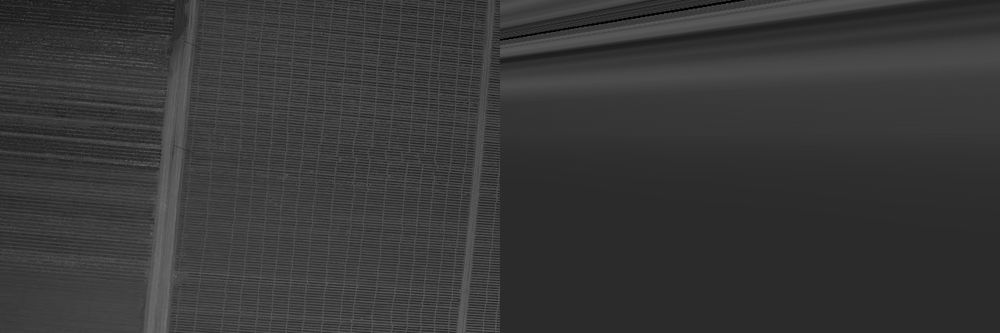

In [97]:
panoramic_5 = panoramic_creator.panoramic(images["foto5A"], images["foto5B"])
cv2_imshow(panoramic_5)

Nas imagem 5, entretanto, houve uma clara distorção da imagem a e a colagem não ficou boa.

##### ORB

Tentaremos, agora, aplicar o descritor Oriented FAST and rotated BRIEF (ORB) com a distância cv2.NORM_HAMMING para encontrar as correspondências.

In [99]:
class PanoramicCreator:
    def find_matches(self, image_a, image_b):
        # Initiate SIFT detector
        orb = cv2.ORB_create()

        # Find the keypoints and descriptors with SIFT
        kp1, des1 = orb.detectAndCompute(image_b, None)
        kp2, des2 = orb.detectAndCompute(image_a, None)

        # BFMatcher with default params
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = matcher.match(des1,des2)

        matches = sorted(matches, key = lambda x:x.distance)

        return kp1, kp2, matches[:10]

    def transform_image(self, image_a, image_b, kp1, kp2, good_matches):
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
        dst_pts = np.float32([kp2[n.trainIdx].pt for n in good_matches]).reshape(-1,1,2)
        M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        height, width = image_b.shape

        pts2 = np.float32([[0,0],[0,height-1],[width-1,height-1],[width-1,0]]).reshape(-1,1,2)
        pts1 = cv2.perspectiveTransform(pts2, M)

        H = cv2.getPerspectiveTransform(pts1, pts2)
        image_a_transformed = cv2.warpPerspective(image_a, H, (width + image_a.shape[1], height))

        return image_a_transformed

    def panoramic(self, image_a, image_b):
        """
        Creates a panoramic.

        Requires image a to be relatively at the left of image b.
        """
        kp1, kp2, good_matches = self.find_matches(image_a, image_b)
        image_a_transformed = self.transform_image(image_a, image_b, kp1, kp2, good_matches)

        return np.hstack((image_b, image_a_transformed[:,image_b.shape[1]:]))

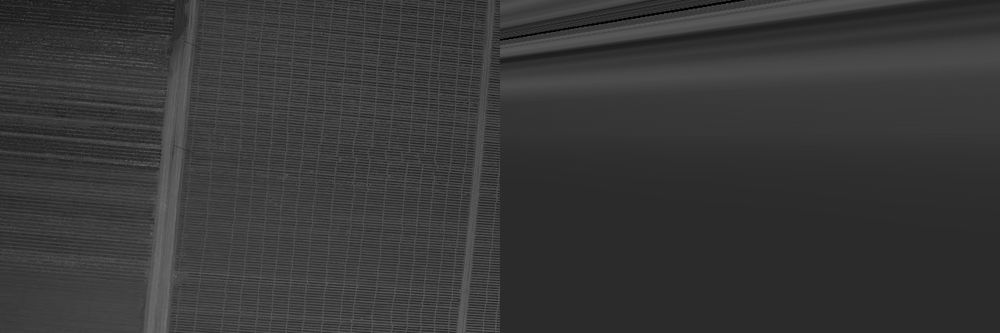

In [100]:
panoramic_5 = panoramic_creator.panoramic(images["foto5A"], images["foto5B"])
cv2_imshow(panoramic_5)

Novamente, não encontramos bons resultados. São necessários mais testes ajustando parâmetros e testando outros descritores mais criticamente de maneira a encontrar uma boa solução.

#### Conclusões

A tarefa de construção de panorâmicas através do registro de imagens e aplicação de transformações geométricas é uma tarefa bastante desafiadora, mas a literatura e grandes bibliotecas de processamento de imagem como o opencv disponibilizam técnicas que facilitam a solução.

A aplicação do descritor SIFT, utilizando medidas de distancia NORM_L2 para medir a distância entre pontos de interesse e selecionar correspondências em imagens se mostrou bastante eficaz para uma boa gama de contextos. Com tais correspondências, foi possível determinar a matriz de homografia que permitiu a aplicação de uma transformação geométrica de uma das imagens seguida de colagem entre a imagem transformada e a imagem base, formando boas panoramicas.

Em imagens com alta presença de texturas mais homogêneas, entretanto, os resultados preliminares obtidos foram fracos tanto utilizando o descritor SIFT quando ORB. Estas evidências indicam que pode ser necessário ajustar parâmetros da solução ou até mesmo experimentar outro descritores.